<a href="https://colab.research.google.com/github/messiah2305/Cp-vton/blob/main/cp_vton%2B%20final%20test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/minar09/cp-vton-plus.git

Cloning into 'cp-vton-plus'...
remote: Enumerating objects: 245, done.
remote: Counting objects: 100% (91/91), done.
remote: Compressing objects: 100% (88/88), done.
remote: Total 245 (delta 52), reused 10 (delta 3), pack-reused 154
Receiving objects: 100% (245/245), 419.58 KiB | 5.52 MiB/s, done.
Resolving deltas: 100% (137/137), done.


In [2]:
#include the first 100 image pairs (human model image, target clothes images)
#to reduce test time

def include_N_image_pairs(filename,N=100):
  with open(filename) as f1:
    lines = f1.readlines()
  with open(filename, 'w') as f2:
    f2.writelines(lines[:N])
  print('Test Sample-> Only the first ',N,' image pairs are included \n from:', filename,'\n to reduce test time' )

include_N_image_pairs(filename='/content/cp-vton-plus/data/test_pairs.txt',N=110) 

Test Sample-> Only the first  110  image pairs are included 
 from: /content/cp-vton-plus/data/test_pairs.txt 
 to reduce test time


In [3]:
%cd "/content/cp-vton-plus"

/content/cp-vton-plus


In [4]:
# it is a good idea to unset the PYTHONPATH variable before installing Miniconda 
#as it can cause problems if there are packages installed and accessible via directories 
#included in the PYTHONPATH that are not compatible with the version of Python included with Miniconda.
%env PYTHONPATH=

env: PYTHONPATH=


In [5]:
#install Miniconda
%%bash
MINICONDA_INSTALLER_SCRIPT=Miniconda3-4.5.4-Linux-x86_64.sh
MINICONDA_PREFIX=/usr/local
wget https://repo.continuum.io/miniconda/$MINICONDA_INSTALLER_SCRIPT
chmod +x $MINICONDA_INSTALLER_SCRIPT
./$MINICONDA_INSTALLER_SCRIPT -b -f -p $MINICONDA_PREFIX

PREFIX=/usr/local
installing: python-3.6.5-hc3d631a_2 ...
installing: ca-certificates-2018.03.07-0 ...
installing: conda-env-2.6.0-h36134e3_1 ...
installing: libgcc-ng-7.2.0-hdf63c60_3 ...
installing: libstdcxx-ng-7.2.0-hdf63c60_3 ...
installing: libffi-3.2.1-hd88cf55_4 ...
installing: ncurses-6.1-hf484d3e_0 ...
installing: openssl-1.0.2o-h20670df_0 ...
installing: tk-8.6.7-hc745277_3 ...
installing: xz-5.2.4-h14c3975_4 ...
installing: yaml-0.1.7-had09818_2 ...
installing: zlib-1.2.11-ha838bed_2 ...
installing: libedit-3.1.20170329-h6b74fdf_2 ...
installing: readline-7.0-ha6073c6_4 ...
installing: sqlite-3.23.1-he433501_0 ...
installing: asn1crypto-0.24.0-py36_0 ...
installing: certifi-2018.4.16-py36_0 ...
installing: chardet-3.0.4-py36h0f667ec_1 ...
installing: idna-2.6-py36h82fb2a8_1 ...
installing: pycosat-0.6.3-py36h0a5515d_0 ...
installing: pycparser-2.18-py36hf9f622e_1 ...
installing: pysocks-1.6.8-py36_0 ...
installing: ruamel_yaml-0.15.37-py36h14c3975_2 ...
installing: six-1.11

--2022-04-09 10:59:52--  https://repo.continuum.io/miniconda/Miniconda3-4.5.4-Linux-x86_64.sh
Resolving repo.continuum.io (repo.continuum.io)... 104.18.200.79, 104.18.201.79, 2606:4700::6812:c94f, ...
Connecting to repo.continuum.io (repo.continuum.io)|104.18.200.79|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://repo.anaconda.com/miniconda/Miniconda3-4.5.4-Linux-x86_64.sh [following]
--2022-04-09 10:59:52--  https://repo.anaconda.com/miniconda/Miniconda3-4.5.4-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.130.3, 104.16.131.3, 2606:4700::6810:8203, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.130.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 58468498 (56M) [application/x-sh]
Saving to: ‘Miniconda3-4.5.4-Linux-x86_64.sh’

     0K .......... .......... .......... .......... ..........  0% 43.7M 1s
    50K .......... .......... .......... .......... ..........  0%

In [6]:
!conda install -y pytorch=1.0.0 torchvision=0.2.1 -c pytorch

Solving environment: - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - 

In [7]:
!pip install -r requirements.txt
#!pip install tensorboardX pillow numpy opencv-contrib-python
!pip install matplotlib

import torch
print("Torch version is installed! Torch ver : " + torch.__version__)
if torch.cuda.is_available():
  print('Cuda is available!')

ERROR: Could not find a version that satisfies the requirement torch==0.4.1 (from versions: 1.0.0, 1.0.1, 1.0.1.post2, 1.1.0, 1.2.0, 1.3.0, 1.3.1, 1.4.0, 1.5.0, 1.5.1, 1.6.0, 1.7.0, 1.7.1, 1.8.0, 1.8.1, 1.9.0, 1.9.1, 1.10.0, 1.10.1, 1.10.2)
ERROR: No matching distribution found for torch==0.4.1
     |████████████████████████████████| 11.5 MB 5.2 MB/s 
     |████████████████████████████████| 1.1 MB 38.6 MB/s 
     |████████████████████████████████| 3.1 MB 32.7 MB/s 
     |████████████████████████████████| 247 kB 20.9 MB/s 
     |████████████████████████████████| 98 kB 6.9 MB/s 
  Attempting uninstall: pillow
    Found existing installation: Pillow 5.4.1
    Uninstalling Pillow-5.4.1:
      Successfully uninstalled Pillow-5.4.1


Torch version is installed! Torch ver : 1.10.0+cu111
Cuda is available!


In [8]:
#install torch CUDA using this way from the source OR it will give error:
#THCudaCheck FAIL file=/pytorch/aten/src/THC/THCGeneral.cpp line=663 error=11 : invalid argument

!pip3 install -U https://download.pytorch.org/whl/cu100/torch-1.0.0-cp36-cp36m-linux_x86_64.whl

     |████████████████████████████████| 753.6 MB 23 kB/s 


In [9]:
#!pip install torch==1.0.0 torchvision==0.2.1 tensorboardX pillow numpy opencv-contrib-python

import torch
print("Torch version is installed! Torch ver : " + torch.__version__)
if torch.cuda.is_available():
  print('Cuda is available!')

Torch version is installed! Torch ver : 1.10.0+cu111
Cuda is available!


In [10]:
#Download pretrained model for testing: /Checkpoints
%cd "/content/cp-vton-plus"
!wget -O CP-VTON+.zip --no-check-certificate "https://onedrive.live.com/download?cid=5435770760F02D2F&resid=5435770760F02D2F%211152&authkey=%21AD6jcLtyet8Y3o4" 


/content/cp-vton-plus
--2022-04-09 11:06:34--  https://onedrive.live.com/download?cid=5435770760F02D2F&resid=5435770760F02D2F%211152&authkey=%21AD6jcLtyet8Y3o4
Resolving onedrive.live.com (onedrive.live.com)... 13.107.42.13
Connecting to onedrive.live.com (onedrive.live.com)|13.107.42.13|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://qkwgsg.ch.files.1drv.com/y4mP6DWfGXeufxPacdoH4g_P6c0_dGLxgI4FDOw02PJV52WQphWC2GqSQngQgDzjV8xWtrUL4OqeeTYZ3d1SHrZaS1bv7FfxA1FD00LtKPLUFUxLSFwuBUfOA0_pKitMLrw5_QH6Dlf_USBm7Qe3eRjw5HOKiTp-t1wqlj136c405NJGHtfjMa-CtYfhnJI0AifISmwPgH8sWUU7obgl0g9vg/CP-VTON%2B.zip?download&psid=1 [following]
--2022-04-09 11:06:35--  https://qkwgsg.ch.files.1drv.com/y4mP6DWfGXeufxPacdoH4g_P6c0_dGLxgI4FDOw02PJV52WQphWC2GqSQngQgDzjV8xWtrUL4OqeeTYZ3d1SHrZaS1bv7FfxA1FD00LtKPLUFUxLSFwuBUfOA0_pKitMLrw5_QH6Dlf_USBm7Qe3eRjw5HOKiTp-t1wqlj136c405NJGHtfjMa-CtYfhnJI0AifISmwPgH8sWUU7obgl0g9vg/CP-VTON%2B.zip?download&psid=1
Resolving qkwgsg.ch.files.1drv.

In [11]:
%rm -rf '/content/cp-vton-plus/checkpoints'

In [12]:
#%rm -rf '/content/cp-vton-plus/checkpoints'
!unzip "/content/cp-vton-plus/CP-VTON+.zip" -d "/content/cp-vton-plus/"
%ls -l /content/cp-vton-plus/checkpoints/GMM/*.*
%ls -l /content/cp-vton-plus/checkpoints/TOM/*.*
#%cp /content/cp-vton-plus/gmm_final.pth /content/cp-vton-plus/checkpoints/checkpoints/TOM/tom_final.pth

Archive:  /content/cp-vton-plus/CP-VTON+.zip
   creating: /content/cp-vton-plus/checkpoints/
   creating: /content/cp-vton-plus/checkpoints/GMM/
  inflating: /content/cp-vton-plus/checkpoints/GMM/gmm_final.pth  
   creating: /content/cp-vton-plus/checkpoints/TOM/
  inflating: /content/cp-vton-plus/checkpoints/TOM/tom_final.pth  
-rw-r--r-- 1 root root 76271454 Feb 20  2020 /content/cp-vton-plus/checkpoints/GMM/gmm_final.pth
-rw-r--r-- 1 root root 85407477 Feb 23  2020 /content/cp-vton-plus/checkpoints/TOM/tom_final.pth


In [13]:
%rm /content/cp-vton-plus/checkpoints/checkpoints/TOM/tom_final.pth
%cp /content/cp-vton-plus/gmm_final.pth /content/cp-vton-plus/checkpoints/checkpoints/TOM/tom_final.pth
%ls -l /content/cp-vton-plus/checkpoints/checkpoints/GMM/*.*

rm: cannot remove '/content/cp-vton-plus/checkpoints/checkpoints/TOM/tom_final.pth': No such file or directory
cp: cannot stat '/content/cp-vton-plus/gmm_final.pth': No such file or directory
ls: cannot access '/content/cp-vton-plus/checkpoints/checkpoints/GMM/*.*': No such file or directory


In [14]:
#Download Datasets and test from onedrive

%cd "/content/cp-vton-plus"
!wget -O viton_plus.zip --no-check-certificate "https://onedrive.live.com/download?cid=5435770760F02D2F&resid=5435770760F02D2F%211156&authkey=%21ABhfRrNiGogM8_o" 


/content/cp-vton-plus
--2022-04-09 11:07:34--  https://onedrive.live.com/download?cid=5435770760F02D2F&resid=5435770760F02D2F%211156&authkey=%21ABhfRrNiGogM8_o
Resolving onedrive.live.com (onedrive.live.com)... 13.107.42.13
Connecting to onedrive.live.com (onedrive.live.com)|13.107.42.13|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://rkwgsg.ch.files.1drv.com/y4m_dx59Kzc3TruwQOJ23hAW2GvzK_zfilrLsEiyR1EnGGkNZTxeLBAFc4U4oqcNCQZmkw2s1Id7aCFjj8GTFVxB5Yj_n3C-4RX5zSklcAmynwv0wCVH7WSWcAA2YkAPkt8xW6mOAdIuQ-ddYUEuTJh68T6cr_oCHHaZslM7j90sVjyoY8p-9jsqD6WlbxvoE6Xgo_Nl3Voyj_xCBB40Hpzqg/viton_plus.zip?download&psid=1 [following]
--2022-04-09 11:07:34--  https://rkwgsg.ch.files.1drv.com/y4m_dx59Kzc3TruwQOJ23hAW2GvzK_zfilrLsEiyR1EnGGkNZTxeLBAFc4U4oqcNCQZmkw2s1Id7aCFjj8GTFVxB5Yj_n3C-4RX5zSklcAmynwv0wCVH7WSWcAA2YkAPkt8xW6mOAdIuQ-ddYUEuTJh68T6cr_oCHHaZslM7j90sVjyoY8p-9jsqD6WlbxvoE6Xgo_Nl3Voyj_xCBB40Hpzqg/viton_plus.zip?download&psid=1
Resolving rkwgsg.ch.files.1drv.

In [15]:
!unzip  "/content/cp-vton-plus/viton_plus.zip" -d "/content/cp-vton-plus"

Streaming output truncated to the last 5000 lines.
  inflating: /content/cp-vton-plus/train/pose/012690_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012692_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012693_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012695_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012696_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012697_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012698_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012699_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012700_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012701_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012703_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012704_0_keypoints.json  
  inflating: /content/cp-vton-plus/train/pose/012705_0_keypoints.json  
  inflating: 

In [16]:
#Copy clothes folder to data from train folder

%cp -av "/content/cp-vton-plus/test" "/content/cp-vton-plus/data"

#%rm -rf "/content/cp-vton-plus/data/cloth"
#%rm -rf "/content/cp-vton-plus/data/test"
#%mkdir "/content/cp-vton-plus/data/test"

#%cp -av "/content/cp-vton-plus/train/cloth" "/content/cp-vton-plus/data/test"
#mv -bv "/content/cp-vton-plus/test" "/content/cp-vton-plus/data"



Streaming output truncated to the last 5000 lines.
'/content/cp-vton-plus/test/image-parse/010599_0.png' -> '/content/cp-vton-plus/data/test/image-parse/010599_0.png'
'/content/cp-vton-plus/test/image-parse/010608_0.png' -> '/content/cp-vton-plus/data/test/image-parse/010608_0.png'
'/content/cp-vton-plus/test/image-parse/010620_0.png' -> '/content/cp-vton-plus/data/test/image-parse/010620_0.png'
'/content/cp-vton-plus/test/image-parse/010628_0.png' -> '/content/cp-vton-plus/data/test/image-parse/010628_0.png'
'/content/cp-vton-plus/test/image-parse/010636_0.png' -> '/content/cp-vton-plus/data/test/image-parse/010636_0.png'
'/content/cp-vton-plus/test/image-parse/010644_0.png' -> '/content/cp-vton-plus/data/test/image-parse/010644_0.png'
'/content/cp-vton-plus/test/image-parse/010653_0.png' -> '/content/cp-vton-plus/data/test/image-parse/010653_0.png'
'/content/cp-vton-plus/test/image-parse/010662_0.png' -> '/content/cp-vton-plus/data/test/image-parse/010662_0.png'
'/content/cp-vton-plu

In [18]:
pip install tensorboardX

     |████████████████████████████████| 125 kB 5.3 MB/s 
     |████████████████████████████████| 1.1 MB 46.2 MB/s 


In [19]:
#Then run test.py for GMM network with the testing dataset, which will 
#generate the warped clothes and masks in "warp-cloth" and "warp-mask" folders inside the "result/GMM/test/" directory. 
!rm -rf '/content/cp-vton-plus/result/GMM'
%ls 
%cd "/content/cp-vton-plus"
!python test.py --name GMM --stage GMM --workers 4 --datamode test --data_list test_pairs.txt --checkpoint /content/cp-vton-plus/checkpoints/GMM/gmm_final.pth

checkpoints/                       networks.py       test.py
cp_dataset.py                      __pycache__/      train/
CP-VTON+.zip                       README.md         train_pairs.txt
data/                              requirements.txt  train.py
grid.png                           teaser.png        visualization.py
LICENSE                            test/             viton_plus.zip
Miniconda3-4.5.4-Linux-x86_64.sh*  test_pairs.txt
/content/cp-vton-plus
Namespace(batch_size=4, checkpoint='/content/cp-vton-plus/checkpoints/GMM/gmm_final.pth', data_list='test_pairs.txt', datamode='test', dataroot='data', display_count=1, fine_height=256, fine_width=192, gpu_ids='', grid_size=5, name='GMM', radius=5, result_dir='result', shuffle=False, stage='GMM', tensorboard_dir='tensorboard', workers=4)
Start to test stage: GMM, named: GMM!
initialization method [normal]
initialization method [normal]
step:        1, time: 2.977
step:        2, time: 2.511
step:        3, time: 1.147
step:        4

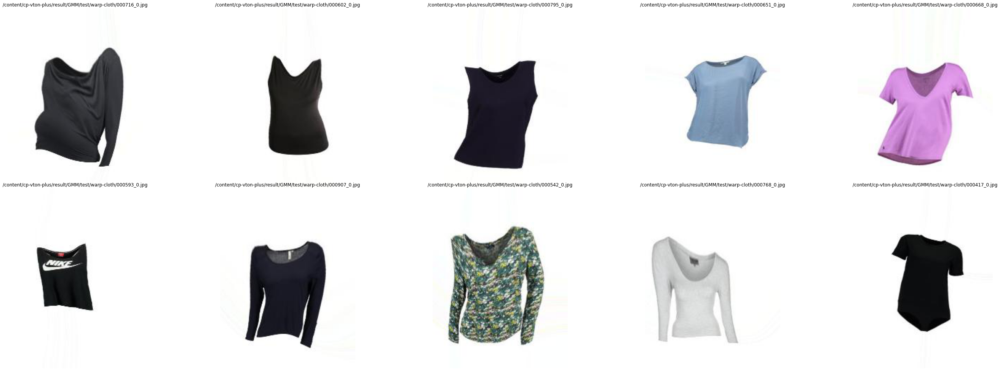

In [20]:
#!pip install matplotlib

import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

def display_images(path,columns=5,max_images=50,image_w=200,n_images=0):
  images = []
  filenames=[]
  for img_path in glob.glob(path+'*.jpg'):
      images.append(mpimg.imread(img_path))
      filenames.append(img_path)
      #print(img_path)

  plt.figure(figsize=(max_images,image_w))
  plt.subplots_adjust(wspace=0.0,hspace=0.0)
  #plt.suptitle(path)
  #columns = 6
  if n_images==0:
    for i, image in enumerate(images):
        plt.subplot(len(images) / columns + 1, columns, i + 1)
        plt.imshow(image)
  else:
    for i in range(0,n_images):
        plt.subplot(len(images) / columns+1 , columns, i + 1)
        plt.axis('off')
        plt.title(filenames[i])
        plt.imshow(images[i])
  #return images, glob.glob(path+'*.jpg')

#GMM warped clothes
display_images('/content/cp-vton-plus/result/GMM/test/warp-cloth/',n_images=10)
#display_images('/content/cp-vton-plus/result/GMM/test/result_dir/')


In [21]:
#Copy the "warp-cloth" and "warp-mask" folders into your data directory, 
#EX: inside "data/test" folder.

%cp -av "/content/cp-vton-plus/result/GMM/test/warp-cloth" "/content/cp-vton-plus/data/test"
%cp -av "/content/cp-vton-plus/result/GMM/test/warp-mask" "/content/cp-vton-plus/data/test"
#%cp -av "/content/cp-vton-plus/result/GMM/test/warped_grid" "/content/cp-vton-plus/data/test"
#%cp -av "/content/cp-vton-plus/result/GMM/test/warp-mask" "/content/cp-vton-plus/data/test"

'/content/cp-vton-plus/result/GMM/test/warp-cloth' -> '/content/cp-vton-plus/data/test/warp-cloth'
'/content/cp-vton-plus/result/GMM/test/warp-cloth/000143_0.jpg' -> '/content/cp-vton-plus/data/test/warp-cloth/000143_0.jpg'
'/content/cp-vton-plus/result/GMM/test/warp-cloth/001038_0.jpg' -> '/content/cp-vton-plus/data/test/warp-cloth/001038_0.jpg'
'/content/cp-vton-plus/result/GMM/test/warp-cloth/000154_0.jpg' -> '/content/cp-vton-plus/data/test/warp-cloth/000154_0.jpg'
'/content/cp-vton-plus/result/GMM/test/warp-cloth/000209_0.jpg' -> '/content/cp-vton-plus/data/test/warp-cloth/000209_0.jpg'
'/content/cp-vton-plus/result/GMM/test/warp-cloth/000676_0.jpg' -> '/content/cp-vton-plus/data/test/warp-cloth/000676_0.jpg'
'/content/cp-vton-plus/result/GMM/test/warp-cloth/000129_0.jpg' -> '/content/cp-vton-plus/data/test/warp-cloth/000129_0.jpg'
'/content/cp-vton-plus/result/GMM/test/warp-cloth/000048_0.jpg' -> '/content/cp-vton-plus/data/test/warp-cloth/000048_0.jpg'
'/content/cp-vton-plus/res

In [22]:
#After run test.py for GMM network with the testing dataset, which will 
#Run TOM stage:
!rm -rf '/content/cp-vton-plus/result/TOM'
%cd "/content/cp-vton-plus"
!python test.py --name TOM --stage TOM --workers 4 --datamode test --data_list test_pairs.txt --checkpoint /content/cp-vton-plus/checkpoints/TOM/tom_final.pth

/content/cp-vton-plus
Namespace(batch_size=4, checkpoint='/content/cp-vton-plus/checkpoints/TOM/tom_final.pth', data_list='test_pairs.txt', datamode='test', dataroot='data', display_count=1, fine_height=256, fine_width=192, gpu_ids='', grid_size=5, name='TOM', radius=5, result_dir='result', shuffle=False, stage='TOM', tensorboard_dir='tensorboard', workers=4)
Start to test stage: TOM, named: TOM!
Dataset size: 00110!
/usr/local/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:129: UserWarning: nn.Upsample is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.{} is deprecated. Use nn.functional.interpolate instead.".format(self.name))
/usr/local/lib/python3.6/site-packages/torch/nn/functional.py:2423: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  "See the documentation of nn.Upsamp

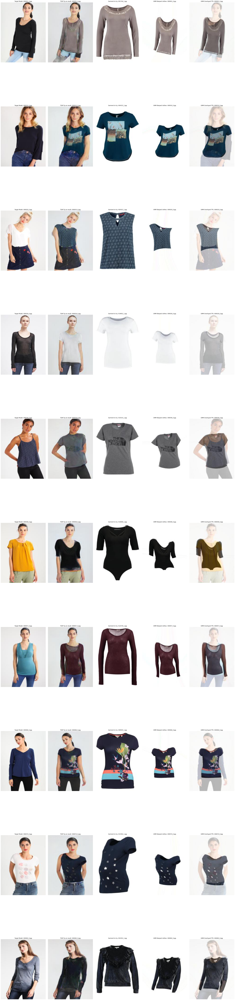

In [23]:
# show tryon source clothes images and target model images
import os.path as osp
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

def get_image_pairs(folder_path,img_pair_file,columns=10,max_images=40,image_w=200,n_images=0,n_results_to_display=5):
  model_images = []
  cloth_images = []
  GMM_warped_clothes=[] #, warped_c_names=display_images('/content/cp-vton-plus/result/GMM/test/warp-cloth/',n_images=n_images)
  GMM_overlayed_TPS=[]
  TOM_tryon_result=[]
  model_names=[]
  cloth_names=[]
  warped_c_names=[]
  n_rows=n_images
  
  with open(osp.join(folder_path, img_pair_file), 'r') as f:
    for line in f.readlines():
        im_name, c_name = line.strip().split()
        model_images.append(mpimg.imread('/content/cp-vton-plus/data/test/image/'+ im_name))
        cloth_images.append(mpimg.imread('/content/cp-vton-plus/data/test/cloth/'+ c_name))
        warpedCloth_name= im_name #c_name
        warpedCloth_name=warpedCloth_name.replace('_1.jpg','_0.jpg')
        #print(warpedCloth_name)
        GMM_warped_clothes.append(mpimg.imread('/content/cp-vton-plus/result/GMM/test'+'/warp-cloth/'+ warpedCloth_name))
        GMM_overlayed_TPS.append(mpimg.imread('/content/cp-vton-plus/result/GMM/test'+'/overlayed_TPS/'+ warpedCloth_name))
        TOM_tryon_result.append(mpimg.imread('/content/cp-vton-plus/result/TOM/test'+'/try-on/'+ warpedCloth_name))
        model_names.append(im_name)
        cloth_names.append(c_name)
        warped_c_names.append(warpedCloth_name)
  
  fig=plt.figure(figsize=(max_images,image_w))
  plt.subplots_adjust(wspace=0.05,hspace=0.05)
  #f, axarr=plt.subplots(len(model_images)+1, 2* columns)
  
  n_images=len(model_images) if n_images==0 else n_images
  rows=columns if columns>n_images else (n_results_to_display*n_images)/columns+1
  index1=1
  for i in range(0,n_images):
    plt.subplot(rows, columns, index1)
    plt.axis('off')
    plt.title('Target Model: '+ model_names[i])
    plt.imshow(model_images[i])

    plt.subplot(rows, columns, index1+1 )
    plt.axis('off')
    plt.title('TOM Try-on result: '+ warped_c_names[i])
    plt.imshow(TOM_tryon_result[i])
            
    plt.subplot(rows, columns, index1+2 )
    plt.axis('off')
    plt.title('Garment to try: '+ cloth_names[i])
    plt.imshow(cloth_images[i])
    
    plt.subplot(rows, columns, index1+3 )
    plt.axis('off')
    plt.title('GMM Warped clothes: '+ warped_c_names[i])
    plt.imshow(GMM_warped_clothes[i])

    plt.subplot(rows, columns, index1+4 )
    plt.axis('off')
    plt.title('GMM Overlayed TPS: '+ warped_c_names[i])
    plt.imshow(GMM_overlayed_TPS[i])
  
    # print(rows, i, index1,index1+1, index1+2, index1+3,index1+4)
    index1+=n_results_to_display
    if i>rows*columns: break

  return model_images, cloth_images

im_models, im_clothes= get_image_pairs('/content/cp-vton-plus/data','test_pairs.txt',n_images=10,columns=5)  

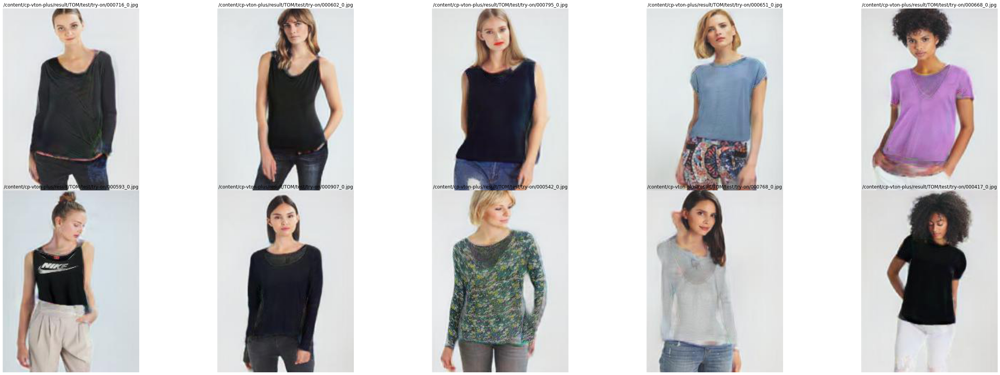

In [24]:
#Display images after applying Try-On TOM model in folder : /content/cp-vton-plus/result/TOM/test/try-on

display_images('/content/cp-vton-plus/result/TOM/test/try-on/',n_images=10)

In [ ]:
#Zip Try-on results folder
!zip -r "/content/cp-vton-plus/result/try-on_Results_CP-VITON-PLUS.zip" "/content/cp-vton-plus/result/TOM/test/try-on"

#zip compress TOM folder
!zip -r "/content/cp-vton-plus/result/TOM_Result_CP-VITON-PLUS.zip" "/content/cp-vton-plus/result/TOM/"

#Zip GMM generated results., mainly warp-masl & warp-cloth that TOM will use
!zip -r "/content/cp-vton-plus/result/GMM_Results_CP-VITON-PLUS.zip" "/content/cp-vton-plus/result/GMM"

In [ ]:
#Download TOM Try-on results generated 

from google.colab import files

#files.download("/content/cp-vton-plus/result/try-on_Results_CP-VITON-PLUS.zip")

In [ ]:
#files.download("/content/cp-vton-plus/result/TOM_Result_CP-VITON-PLUS.zip")


In [ ]:
#files.download("/content/cp-vton-plus/result/GMM_Results_CP-VITON-PLUS.zip")